<a href="https://colab.research.google.com/github/jungfsg/AIFFEL_quest_cr/blob/main/Python/tmp/jellyfishBase_C4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import pandas as pd
import os

In [6]:
import kagglehub
path = kagglehub.dataset_download('anshtanwar/jellyfish-types')
print("데이터셋 파일 경로:", path)

100%|██████████| 25.5M/25.5M [00:00<00:00, 162MB/s]

Extracting files...


데이터셋 파일 경로: /root/.cache/kagglehub/datasets/anshtanwar/jellyfish-types/versions/16


In [7]:
print("다운로드된 파일 목록:")
print(os.listdir(path))

다운로드된 파일 목록:
['blue_jellyfish', 'barrel_jellyfish', 'lions_mane_jellyfish', 'Moon_jellyfish', 'compass_jellyfish', 'Train_Test_Valid', 'mauve_stinger_jellyfish']


In [8]:
# 폴더 구조 확인
train_test_valid_path = os.path.join(path, 'Train_Test_Valid')
if os.path.exists(train_test_valid_path):
    print("\nTrain_Test_Valid 폴더 내용:")
    print(os.listdir(train_test_valid_path))

    # 훈련 데이터 경로
    train_path = os.path.join(train_test_valid_path, 'Train')
    if os.path.exists(train_path):
        train_files = pd.DataFrame(os.listdir(train_path), columns=['Files_Name'])
        print("\n훈련 파일:")
        print(train_files.head())
    else:
        print(f"\n'Train' 폴더를 찾을 수 없습니다.")

    # 검증 데이터 경로
    valid_path = os.path.join(train_test_valid_path, 'valid')
    if os.path.exists(valid_path):
        valid_files = pd.DataFrame(os.listdir(valid_path), columns=['Files_Name'])
        print("\n검증 파일:")
        print(valid_files.head())
    else:
        print(f"\n'valid' 폴더를 찾을 수 없습니다.")
else:
    print(f"\n'Train_Test_Valid' 폴더를 찾을 수 없습니다.")


Train_Test_Valid 폴더 내용:
['valid', 'Train', 'test']

훈련 파일:
             Files_Name
0        blue_jellyfish
1      barrel_jellyfish
2  lions_mane_jellyfish
3        Moon_jellyfish
4     compass_jellyfish

검증 파일:
             Files_Name
0        blue_jellyfish
1      barrel_jellyfish
2  lions_mane_jellyfish
3        Moon_jellyfish
4     compass_jellyfish


In [9]:
import glob
import numpy as np

def create_dataframe(image_folder):
    files = glob.glob(os.path.join(image_folder, '**', '*.*'), recursive=True)
    np.random.shuffle(files)
    labels = [os.path.basename(os.path.dirname(f)) for f in files]
    return pd.DataFrame({'Image': files, 'Label': labels})

dataframe_train = create_dataframe(train_path)
dataframe_valid = create_dataframe(valid_path)

Dataset                   Training  Validation
Label                                         
Moon_jellyfish           16.666667   15.384615
barrel_jellyfish         16.666667   12.820513
blue_jellyfish           16.666667   17.948718
compass_jellyfish        16.666667   17.948718
lions_mane_jellyfish     16.666667   17.948718
mauve_stinger_jellyfish  16.666667   17.948718


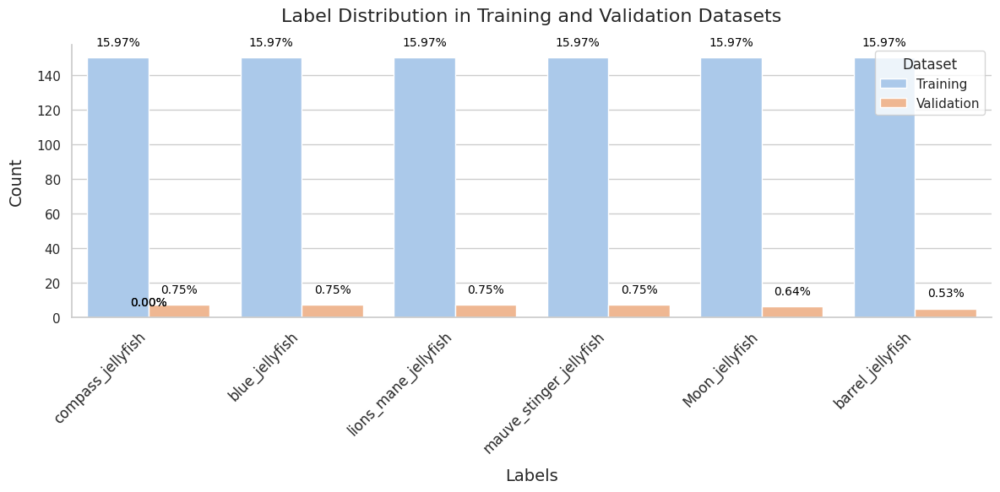

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

dataframe_train['Dataset'] = 'Training'
dataframe_valid['Dataset'] = 'Validation'

combined_df = pd.concat([dataframe_train, dataframe_valid], ignore_index=True)

sns.set_theme(style="whitegrid")

count_data = combined_df.groupby(['Label', 'Dataset']).size().unstack(fill_value=0)
percentage_data = count_data.div(count_data.sum(axis=0), axis=1) * 100

print(percentage_data)

palette = sns.color_palette("pastel", len(count_data))

plt.figure(figsize=(12, 6))
ax = sns.countplot(data=combined_df, x="Label", hue="Dataset", order=count_data.sum(axis=1).sort_values(ascending=False).index, palette="pastel")

for p in ax.patches:
    height = p.get_height()
    percentage = f'{(height / len(combined_df)) * 100:.2f}%'
    ax.annotate(percentage,
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 8), textcoords='offset points')

plt.xticks(rotation=45, ha='right', fontsize=12)

plt.title("Label Distribution in Training and Validation Datasets", fontsize=16, pad=20)
plt.xlabel("Labels", fontsize=14, labelpad=10)
plt.ylabel("Count", fontsize=14, labelpad=10)

sns.despine()

plt.tight_layout()
plt.show()

In [12]:
import tensorflow as tf

batch_size = 16
target_size = (224,224)
train= tf.keras.preprocessing.image_dataset_from_directory(
    train_path,
    validation_split=None,
    image_size=target_size,
    batch_size=batch_size,
)
validation= tf.keras.preprocessing.image_dataset_from_directory(
    valid_path,
    validation_split=None,
    image_size=target_size,
    batch_size=batch_size,
)

Found 900 files belonging to 6 classes.
Found 39 files belonging to 6 classes.


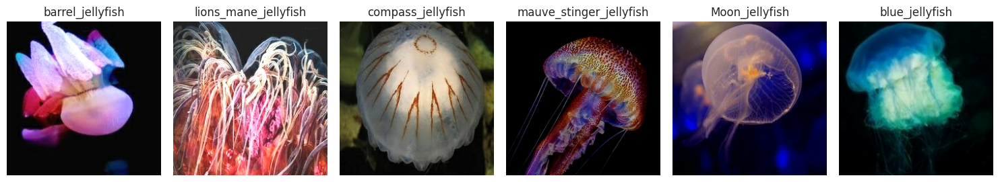

In [13]:
class_labels = train.class_names

plt.figure(figsize=(15, 10))

shown_classes = set()

for images, labels in train.take(1):
    for i in range(len(images)):
        class_name = class_labels[labels[i]]
        if class_name not in shown_classes:
            ax = plt.subplot(1, 6, len(shown_classes) + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(class_name)
            plt.axis("off")
            shown_classes.add(class_name)

        if len(shown_classes) == len(class_labels):
            break

plt.tight_layout()
plt.show()

In [14]:
import wandb
from wandb.integration.keras import WandbCallback
from datetime import datetime

run_name = f"vgg16-{datetime.now().strftime('%Y%m%d-%H%M%S')}"
wandb.init(
    project="jellyfish-classification",
    name=run_name,
    )

config = wandb.config
config.learning_rate = 0.001
config.batch_size = 16
config.epochs = 10
config.optimizer = "adam"
config.model = "VGG16"


wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: jungfsg (jungfsg-) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [15]:
# 모델 정의

base_model = tf.keras.applications.VGG16(
    include_top=False,  # 완전 연결 레이어 제외
    weights='imagenet',
    input_shape=(224, 224, 3)  # 입력 이미지 크기
)

base_model.trainable = False

# 새로운 분류 헤드 추가
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(len(train.class_names), activation='softmax')  # 해파리 클래스 수에 맞게
])

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [16]:
# 컴파일

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=config.learning_rate),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [17]:
# wandb 콜백 커스텀(VGG16 기반에서 기본 콜백함수는 오류가 자주 생긴다고 함)

class MyWandbCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs is not None:
            wandb.log(logs, step=epoch)


In [18]:
import tensorflow as tf
print("GPU 사용 가능:", len(tf.config.list_physical_devices('GPU')) > 0)
print("사용 가능한 GPU 목록:", tf.config.list_physical_devices('GPU'))
print(tf.__version__)

GPU 사용 가능: True
사용 가능한 GPU 목록: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
2.18.0


In [19]:
# fit
with tf.device('/GPU:0'):
    history = model.fit(
        train,
        validation_data=validation,
        epochs=10,
        batch_size=16,
        callbacks=[MyWandbCallback()]
    )


Epoch 1/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 23s 227ms/step - accuracy: 0.3762 - loss: 5.7450 - val_accuracy: 0.5641 - val_loss: 1.5893
Epoch 2/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - accuracy: 0.7684 - loss: 0.8403 - val_accuracy: 0.6667 - val_loss: 1.0776
Epoch 3/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.8593 - loss: 0.3972 - val_accuracy: 0.6410 - val_loss: 1.2799
Epoch 4/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.8910 - loss: 0.2781 - val_accuracy: 0.6923 - val_loss: 1.4041
Epoch 5/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.9540 - loss: 0.1441 - val_accuracy: 0.6410 - val_loss: 1.5183
Epoch 6/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.9557 - loss: 0.1114 - val_accuracy: 0.6667 - val_loss: 1.6930
Epoch 7/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - accuracy: 0.9579 - loss: 0.1110 - val_accuracy: 0.6923 - val_loss: 1.7186
Epoch 8/10
57/57 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.9657 - loss: 0.1009 - val_accuracy: 0

In [20]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [23]:
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),  # 모델에서 사용한 크기로 설정
    batch_size=16,
    class_mode='categorical',
    shuffle=False  # 순서 유지를 위해 셔플 비활성화
)

Found 900 images belonging to 6 classes.


57/57 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step

클래스 'Moon_jellyfish' 의 정답 확률이 가장 낮은 5개 이미지:
                         filename      true_class  true_class_probability
61   Moon_jellyfish/aug-19-28.jpg  Moon_jellyfish               16.613968
65   Moon_jellyfish/aug-22-31.jpg  Moon_jellyfish               17.211409
77   Moon_jellyfish/aug-33-45.jpg  Moon_jellyfish               18.271503
130  Moon_jellyfish/aug-81-46.jpg  Moon_jellyfish               18.273310
34          Moon_jellyfish/46.jpg  Moon_jellyfish               18.339777


<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

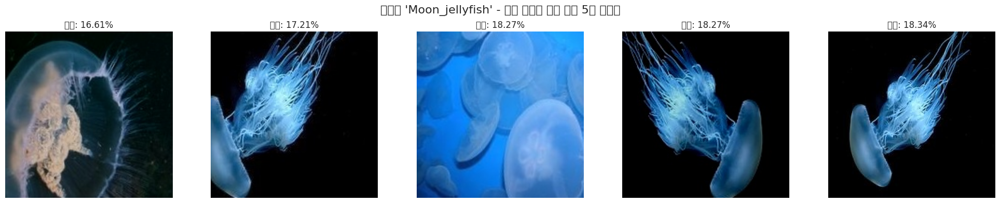


클래스 'barrel_jellyfish' 의 정답 확률이 가장 낮은 5개 이미지:
                           filename        true_class  true_class_probability
265  barrel_jellyfish/aug-68-34.jpg  barrel_jellyfish               10.577635
181         barrel_jellyfish/38.jpg  barrel_jellyfish               10.634730
225  barrel_jellyfish/aug-31-38.jpg  barrel_jellyfish               10.786481
270  barrel_jellyfish/aug-72-38.jpg  barrel_jellyfish               11.050086
213  barrel_jellyfish/aug-20-27.jpg  barrel_jellyfish               11.112382


<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

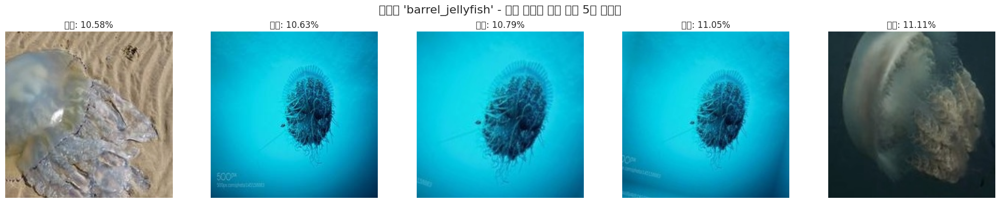


클래스 'blue_jellyfish' 의 정답 확률이 가장 낮은 5개 이미지:
                         filename      true_class  true_class_probability
331         blue_jellyfish/44.jpg  blue_jellyfish               11.778930
330         blue_jellyfish/43.jpg  blue_jellyfish               11.814163
379  blue_jellyfish/aug-30-43.jpg  blue_jellyfish               11.820101
439  blue_jellyfish/aug-85-43.jpg  blue_jellyfish               11.840845
411   blue_jellyfish/aug-6-09.jpg  blue_jellyfish               11.982823


<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

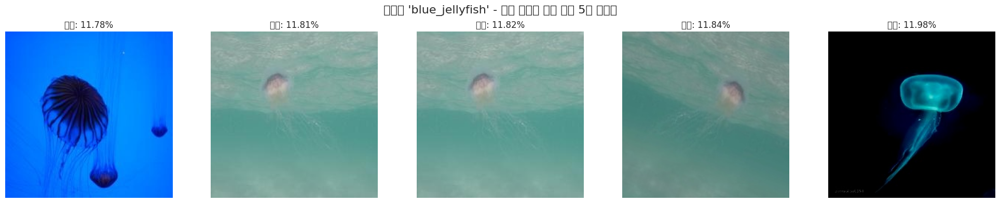


클래스 'compass_jellyfish' 의 정답 확률이 가장 낮은 5개 이미지:
                            filename         true_class  \
597  compass_jellyfish/aug-90-42.jpg  compass_jellyfish   
513  compass_jellyfish/aug-14-17.jpg  compass_jellyfish   
464         compass_jellyfish/17.jpg  compass_jellyfish   
576  compass_jellyfish/aug-71-17.jpg  compass_jellyfish   
563   compass_jellyfish/aug-6-08.jpg  compass_jellyfish   

     true_class_probability  
597               34.344070  
513               34.697678  
464               34.700905  
576               35.696812  
563               35.940311  


<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

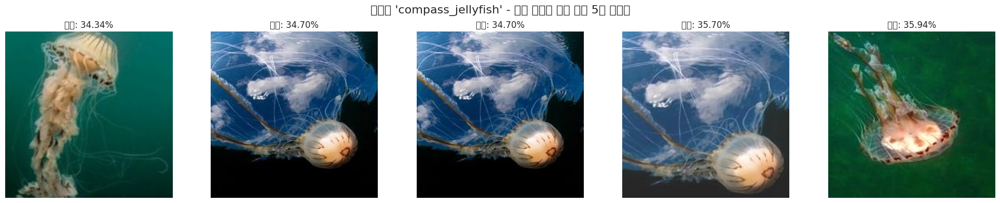


클래스 'lions_mane_jellyfish' 의 정답 확률이 가장 낮은 5개 이미지:
                                filename            true_class  \
675   lions_mane_jellyfish/aug-21-26.JPG  lions_mane_jellyfish   
661    lions_mane_jellyfish/aug-0-01.jpg  lions_mane_jellyfish   
651          lions_mane_jellyfish/68.jpg  lions_mane_jellyfish   
715  lions_mane_jellyfish/aug-58-75.jpeg  lions_mane_jellyfish   
708   lions_mane_jellyfish/aug-51-68.jpg  lions_mane_jellyfish   

     true_class_probability  
675                4.964113  
661                5.073258  
651                5.431658  
715                5.689289  
708                5.719767  


<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

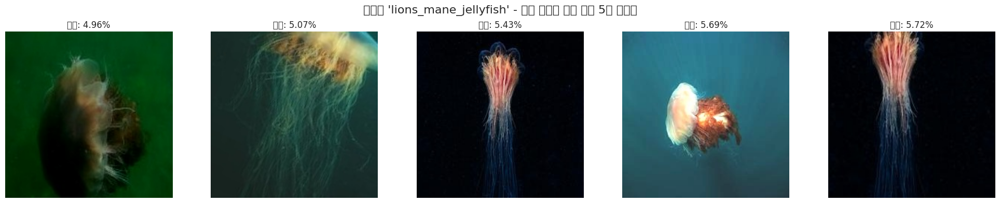


클래스 'mauve_stinger_jellyfish' 의 정답 확률이 가장 낮은 5개 이미지:
                                  filename               true_class  \
762         mauve_stinger_jellyfish/16.jpg  mauve_stinger_jellyfish   
894  mauve_stinger_jellyfish/aug-87-37.jpg  mauve_stinger_jellyfish   
876  mauve_stinger_jellyfish/aug-70-16.jpg  mauve_stinger_jellyfish   
868  mauve_stinger_jellyfish/aug-63-06.jpg  mauve_stinger_jellyfish   
779         mauve_stinger_jellyfish/37.jpg  mauve_stinger_jellyfish   

     true_class_probability  
762               10.563048  
894               10.789274  
876               10.904808  
868               10.913635  
779               11.275480  


<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-27-0bb30c224384>:42: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

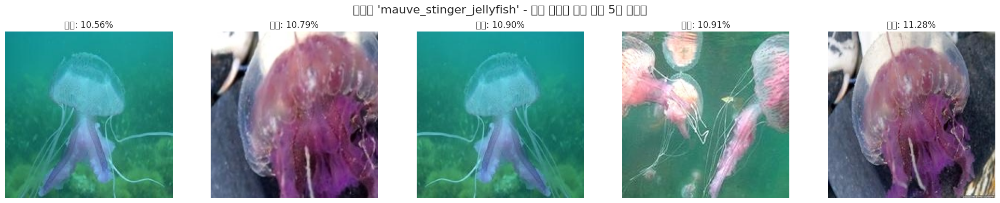

In [27]:
from PIL import Image
predictions = model.predict(train_generator)

# 실제 클래스 및 파일명
true_classes = train_generator.classes
filenames = train_generator.filenames
class_indices = {v: k for k, v in train_generator.class_indices.items()}

# 각 이미지의 정답 클래스에 대한 확률 계산
true_class_probs = [pred[true_class] for pred, true_class in zip(predictions, true_classes)]

# 결과 데이터프레임 생성
results = pd.DataFrame({
    'filename': filenames,
    'true_class': [class_indices[c] for c in true_classes],
    'true_class_probability': [prob * 100 for prob in true_class_probs]
})

# 정답 확률이 낮은 순으로 정렬하고 5개 출력
for class_name in class_indices.values():
    class_results = results[results['true_class'] == class_name]
    lowest_5 = class_results.sort_values('true_class_probability').head(5)

    print(f"\n클래스 '{class_name}' 의 정답 확률이 가장 낮은 5개 이미지:")
    print(lowest_5)
    plt.figure(figsize=(20, 4))
    plt.suptitle(f"클래스 '{class_name}' - 정답 확률이 가장 낮은 5개 이미지", fontsize=16)

    for i, (_, row) in enumerate(lowest_5.iterrows()):
        # 이미지 파일 경로 생성
        img_path = os.path.join(train_path, row['filename'])

        # 이미지 로드
        img = Image.open(img_path)

        # 서브플롯 생성
        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        plt.title(f"확률: {row['true_class_probability']:.2f}%")
        plt.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # 제목을 위한 여백 조정
    plt.show()

In [29]:
highest_5 = class_results.sort_values('true_class_probability').tail(5)
print(highest_5)

                                  filename               true_class  \
884  mauve_stinger_jellyfish/aug-78-25.jpg  mauve_stinger_jellyfish   
867  mauve_stinger_jellyfish/aug-62-05.jpg  mauve_stinger_jellyfish   
816  mauve_stinger_jellyfish/aug-16-21.jpg  mauve_stinger_jellyfish   
880  mauve_stinger_jellyfish/aug-74-21.jpg  mauve_stinger_jellyfish   
766         mauve_stinger_jellyfish/21.jpg  mauve_stinger_jellyfish   

     true_class_probability  
884               23.475889  
867               25.564680  
816               26.870750  
880               27.856955  
766               28.154051  



클래스 'Moon_jellyfish' 의 정답 확률이 가장 높은 5개 이미지:
                         filename      true_class  true_class_probability
45          Moon_jellyfish/58.jpg  Moon_jellyfish               30.471590
89   Moon_jellyfish/aug-44-57.jpg  Moon_jellyfish               30.780479
142  Moon_jellyfish/aug-92-58.jpg  Moon_jellyfish               31.335121
146  Moon_jellyfish/aug-96-03.jpg  Moon_jellyfish               31.892582
90   Moon_jellyfish/aug-45-58.jpg  Moon_jellyfish               33.489361


<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

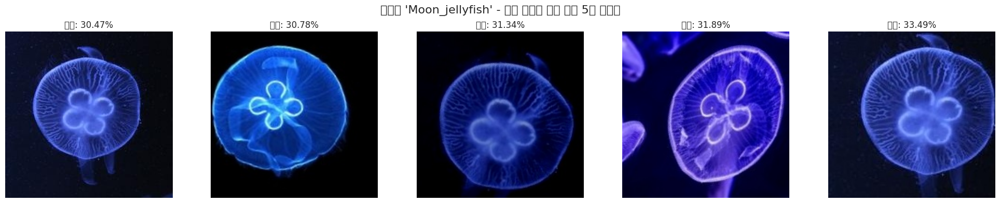


클래스 'barrel_jellyfish' 의 정답 확률이 가장 높은 5개 이미지:
                           filename        true_class  true_class_probability
159         barrel_jellyfish/12.jpg  barrel_jellyfish               20.407261
151         barrel_jellyfish/02.jpg  barrel_jellyfish               20.424377
246  barrel_jellyfish/aug-50-12.jpg  barrel_jellyfish               20.790226
268  barrel_jellyfish/aug-70-36.jpg  barrel_jellyfish               20.887594
237  barrel_jellyfish/aug-42-02.jpg  barrel_jellyfish               21.600800


<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

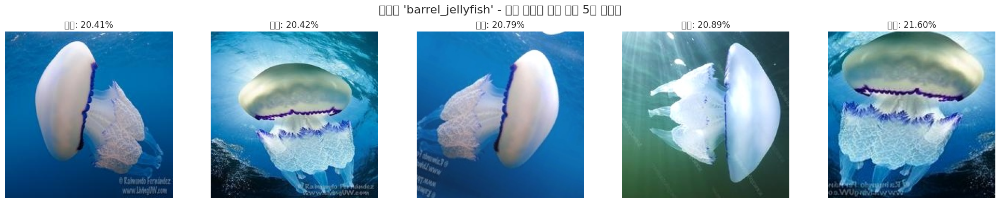


클래스 'blue_jellyfish' 의 정답 확률이 가장 높은 5개 이미지:
                         filename      true_class  true_class_probability
374  blue_jellyfish/aug-26-39.jpg  blue_jellyfish               18.701666
421  blue_jellyfish/aug-69-23.jpg  blue_jellyfish               18.823008
361  blue_jellyfish/aug-14-23.jpg  blue_jellyfish               19.178452
435  blue_jellyfish/aug-81-39.jpg  blue_jellyfish               19.232279
314         blue_jellyfish/23.jpg  blue_jellyfish               20.344580


<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

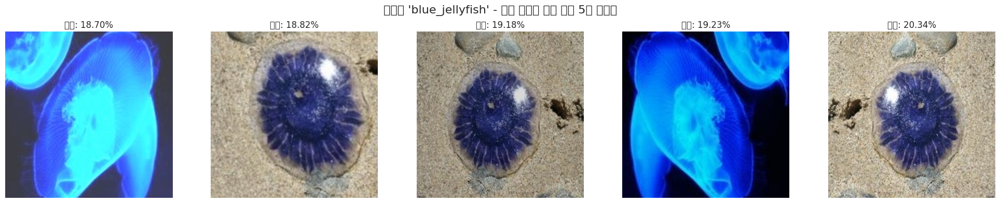


클래스 'compass_jellyfish' 의 정답 확률이 가장 높은 5개 이미지:
                            filename         true_class  \
458         compass_jellyfish/10.jpg  compass_jellyfish   
467         compass_jellyfish/21.jpg  compass_jellyfish   
482         compass_jellyfish/39.jpg  compass_jellyfish   
595  compass_jellyfish/aug-89-39.jpg  compass_jellyfish   
533  compass_jellyfish/aug-32-39.jpg  compass_jellyfish   

     true_class_probability  
458               48.331661  
467               48.496471  
482               49.489384  
595               50.672054  
533               52.815117  


<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

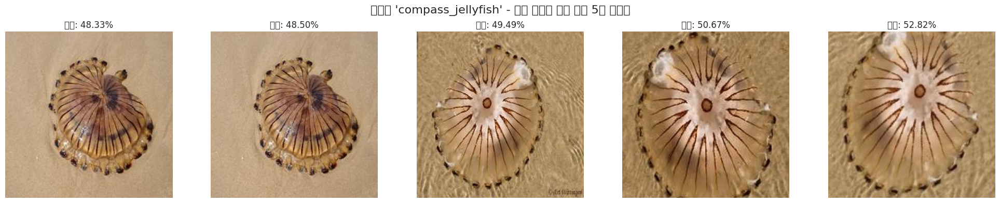


클래스 'lions_mane_jellyfish' 의 정답 확률이 가장 높은 5개 이미지:
                               filename            true_class  \
692  lions_mane_jellyfish/aug-37-47.jpg  lions_mane_jellyfish   
730  lions_mane_jellyfish/aug-71-11.jpg  lions_mane_jellyfish   
690  lions_mane_jellyfish/aug-35-44.jpg  lions_mane_jellyfish   
710  lions_mane_jellyfish/aug-53-70.jpg  lions_mane_jellyfish   
653         lions_mane_jellyfish/70.jpg  lions_mane_jellyfish   

     true_class_probability  
692               11.557046  
730               11.724151  
690               12.657576  
710               12.681220  
653               13.298258  


<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

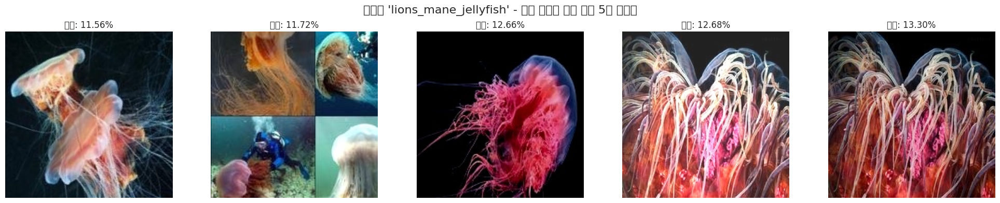


클래스 'mauve_stinger_jellyfish' 의 정답 확률이 가장 높은 5개 이미지:
                                  filename               true_class  \
884  mauve_stinger_jellyfish/aug-78-25.jpg  mauve_stinger_jellyfish   
867  mauve_stinger_jellyfish/aug-62-05.jpg  mauve_stinger_jellyfish   
816  mauve_stinger_jellyfish/aug-16-21.jpg  mauve_stinger_jellyfish   
880  mauve_stinger_jellyfish/aug-74-21.jpg  mauve_stinger_jellyfish   
766         mauve_stinger_jellyfish/21.jpg  mauve_stinger_jellyfish   

     true_class_probability  
884               23.475889  
867               25.564680  
816               26.870750  
880               27.856955  
766               28.154051  


<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 54869 (\N{HANGUL SYLLABLE HWAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47456 (\N{HANGUL SYLLABLE RYUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 47000 (\N{HANGUL SYLLABLE RAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-f14c75968fe7>:23: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<

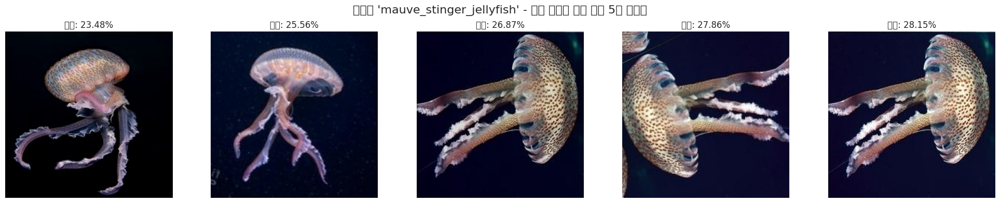

In [30]:

for class_name in class_indices.values():
    class_results = results[results['true_class'] == class_name]
    highest_5 = class_results.sort_values('true_class_probability').tail(5)

    print(f"\n클래스 '{class_name}' 의 정답 확률이 가장 높은 5개 이미지:")
    print(highest_5)
    plt.figure(figsize=(20, 4))
    plt.suptitle(f"클래스 '{class_name}' - 정답 확률이 가장 높은 5개 이미지", fontsize=16)

    for i, (_, row) in enumerate(highest_5.iterrows()):
        # 이미지 파일 경로 생성
        img_path = os.path.join(train_path, row['filename'])

        # 이미지 로드
        img = Image.open(img_path)

        # 서브플롯 생성
        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        plt.title(f"확률: {row['true_class_probability']:.2f}%")
        plt.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # 제목을 위한 여백 조정
    plt.show()